# Data import

In [81]:
import scanpy as sc
file_path = "/home/Data_Drive_8TB/kykim/1. Oval/Monocle/Luminal_adata.h5ad"
total_adata = sc.read_h5ad(file_path)

In [82]:
total_adata.X = total_adata.layers['counts']

In [83]:
dense_matrix = total_adata.X.toarray()
print(dense_matrix.shape)
dense_matrix

(7928, 12000)


array([[0, 0, 0, ..., 1, 0, 0],
       [0, 0, 7, ..., 0, 1, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 2, 1, 0],
       [0, 0, 0, ..., 0, 1, 0]])

In [84]:
import numpy as np
total_adata.obs["age_num"] = total_adata.obs["age"].str.extract(r"(\d+)").astype(int)
total_adata.obs['age_group'] = np.where(total_adata.obs['age_num'] > 70, 'Aged', 'Young')

sc.pp.normalize_total(total_adata)
sc.pp.log1p(total_adata)
sc.pp.highly_variable_genes(total_adata, n_top_genes=10000, batch_key="sample_id")
total_adata = total_adata[:, total_adata.var['highly_variable']].copy()

... storing 'age_group' as categorical


In [85]:
'Muc4' in total_adata.var_names

True

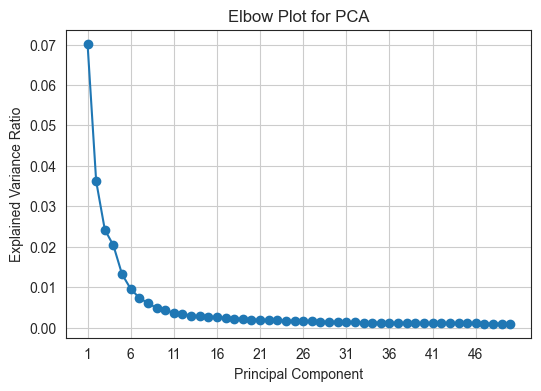

In [86]:
import matplotlib.pyplot as plt

sc.tl.pca(total_adata)
explained_variance_ratio = total_adata.uns["pca"]["variance_ratio"]
plt.figure(figsize=(6, 4))
plt.plot(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, marker="o", linestyle="-")
plt.xlabel("Principal Component")
plt.ylabel("Explained Variance Ratio")
plt.title("Elbow Plot for PCA")
plt.xticks(np.arange(1, len(explained_variance_ratio) + 1, step=5))
plt.grid()
plt.show()

In [87]:
sc.tl.pca(total_adata, n_comps=11, svd_solver='arpack')

In [88]:
sc.pp.neighbors(total_adata)

In [89]:
import pandas as pd

umap_df = pd.read_csv("/home/Data_Drive_8TB/kykim/1. Oval/Monocle/trajectory_UMAP_coordinate.csv")

adata_barcodes = total_adata.obs.index.astype(str)
umap_barcodes = umap_df['cell_id'].astype(str)
common_barcodes = np.intersect1d(adata_barcodes, umap_barcodes)

print(f"교집합 셀 수: {len(common_barcodes)}")

umap_common = umap_df[umap_df['cell_id'].isin(common_barcodes)].set_index('cell_id')
total_adata_subset = total_adata[common_barcodes, :].copy()
total_adata_subset.obsm['X_umap'] = umap_common[['UMAP_1', 'UMAP_2']].values
total_adata_subset.obs['pseudotime'] = umap_common['pseudotime']

교집합 셀 수: 6542


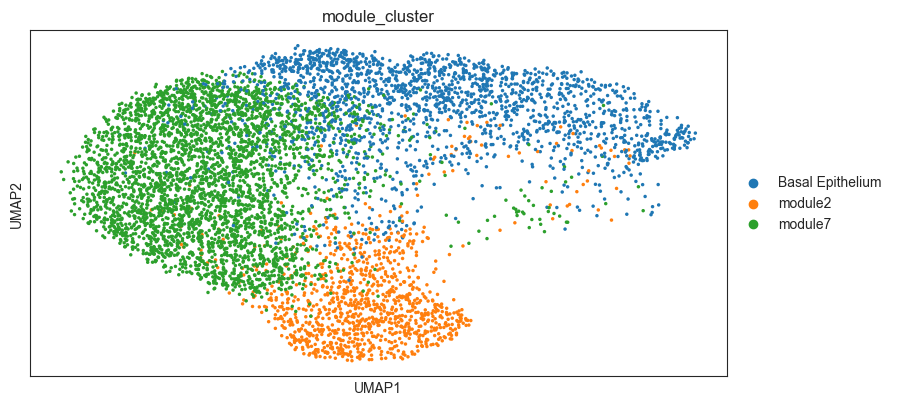

In [90]:
sc.pl.umap(
    total_adata_subset,
    color="module_cluster",
    size=25,
)

In [93]:
total_adata_subset = total_adata_subset[total_adata_subset.obs['module_cluster'] != 'Basal Epithelium']

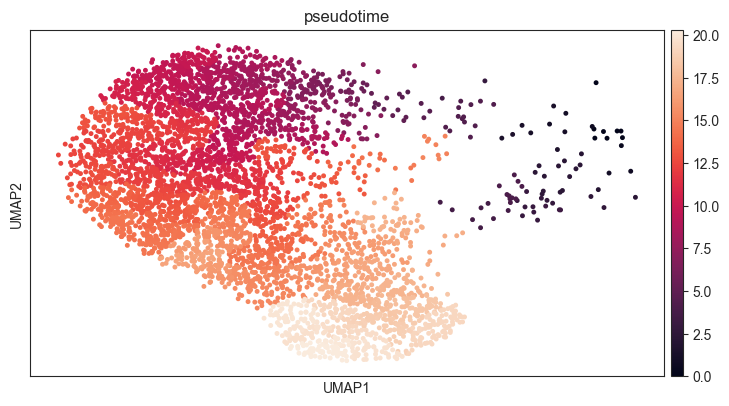

In [94]:
sc.pl.umap(
    total_adata_subset,
    color="pseudotime",
    # Setting a smaller point size to get prevent overlap
    size=50,
)

# Cell Oracle

In [95]:
import pandas as pd

path = "/home/Data_Drive_8TB/kykim/1. Oval/Tenet/From_Basal_to_2/TE_result_matrix.byGRN.fdr0.01.sif"

df = pd.read_csv(path, sep="\t", header=None)
df.columns = ["source", "interaction", "target"]

In [96]:
base_GRN = (df.pivot_table(
        index="source",
        columns="target",
        values="interaction",
        aggfunc="max",
        fill_value=0.0))

In [97]:
Paul_15_data = (
    df.groupby("source")["target"]
      .apply(lambda x: ", ".join(sorted(x.unique())))
      .reset_index()
      .rename(columns={"source": "TF", "target": "Target_genes"}))

In [98]:
list(Paul_15_data[Paul_15_data['TF'] == 'Mxd1']['Target_genes'])

['4930523C07Rik, 6030419C18Rik, AA467197, AC160336.1, Abcc1, Abl2, Abtb2, Actn1, Adam8, Adgrl2, Ahnak, Ahr, Akr1b3, Akr1b8, Alkbh5, Alpl, Amfr, Ankrd28, Ankrd44, Ankrd50, Ano6, Anxa1, Anxa3, Anxa8, Aoc1, Apobec1, Arf2, Arhgap17, Arhgap32, Arhgef4, Arhgef5, Arih1, Arih2, Arl14, Arntl, Arrdc4, Aspa, Atf5, Atp10b, Atp6v1b2, Atxn7, B4galt5, BC005537, Bach1, Baiap2, Basp1, Baz1a, Blcap, Brd2, C3, Camk2d, Capn2, Cast, Cavin1, Cavin3, Ccdc71l, Ccnd1, Ccng2, Cd109, Cdc42bpb, Cdc42ep3, Cdkn1a, Ceacam1, Celf4, Cflar, Chac1, Clca1, Clca3b, Cldn4, Clip1, Cnksr1, Cp, Cpeb2, Crabp2, Creb5, Crim1, Crybg1, Crybg3, Csnk1g3, Cyld, Cyr61, Dgat2, Dhx32, Dirc2, Dlc1, Dmkn, Dmxl1, Dnajb2, Dnmbp, Dot1l, Dst, Dstn, Dusp10, Dusp3, Dusp5, Eaf1, Efna5, Efnb2, Egfr, Ehd1, Eif4e, Elk4, Ell2, Endod1, Ephb3, Eppk1, Eps8, Erc1, Ern1, Ero1l, Esyt2, Ets1, Exoc5, F3, Fam102b, Fam107b, Fam110c, Fam129b, Fam13b, Fam20c, Fam83h, Fam84a, Far1, Fat1, Fbxo30, Fbxo32, Fcgbp, Fcho2, Fgd3, Fgd6, Fhl2, Flna, Flnb, Fndc3b, Fosl1, 

In [99]:
#################
## Calculate oracle

In [100]:
import os
import sys

import matplotlib.colors as colors
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scanpy as sc
import seaborn as sns
import celloracle as co

10000 genes were found in the adata. Note that Celloracle is intended to use around 1000-3000 genes, so the behavior with this number of genes may differ from what is expected.


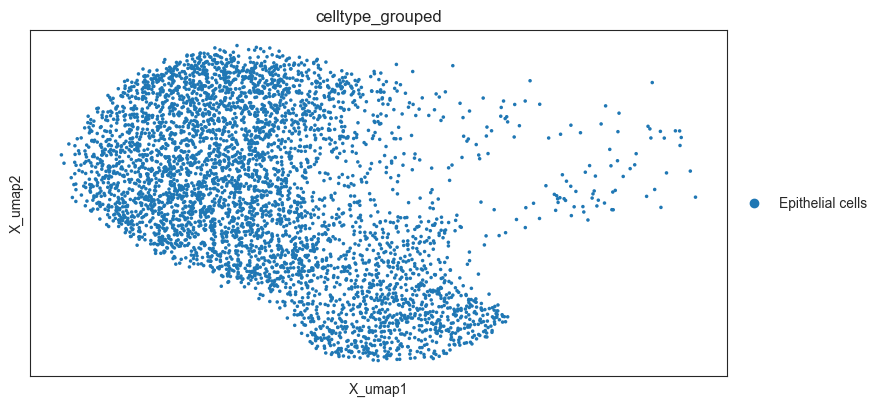

In [101]:
oracle = co.Oracle()
total_adata_subset.X = total_adata_subset.layers["counts"].copy()
oracle.import_anndata_as_raw_count(adata=total_adata_subset,
                                   cluster_column_name="celltype_grouped",
                                   embedding_name="X_umap")

In [102]:
TF_to_TG_dictionary = {}

for TF, TGs in zip(Paul_15_data.TF, Paul_15_data.Target_genes):
    TG_list = TGs.replace(" ", "").split(",")
    TF_to_TG_dictionary[TF] = TG_list

TG_to_TF_dictionary = co.utility.inverse_dictionary(TF_to_TG_dictionary)

  0%|          | 0/573 [00:00<?, ?it/s]

In [103]:
oracle.addTFinfo_dictionary(TG_to_TF_dictionary)

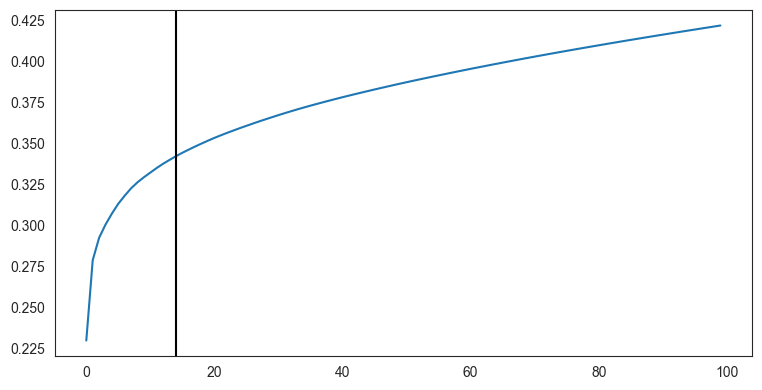

14


In [104]:
oracle.perform_PCA()

plt.plot(np.cumsum(oracle.pca.explained_variance_ratio_)[:100])
n_comps = np.where(np.diff(np.diff(np.cumsum(oracle.pca.explained_variance_ratio_))>0.002))[0][0]
plt.axvline(n_comps, c="k")
plt.show()
print(n_comps)
n_comps = min(n_comps, 20)

In [105]:
n_cell = oracle.adata.shape[0]
print(f"cell number is :{n_cell}")
k = int(0.025*n_cell)
print(f"Auto-selected k is :{k}")
oracle.knn_imputation(n_pca_dims=n_comps, k=k, balanced=True, b_sight=k*8,
                      b_maxl=k*4, n_jobs=4)

cell number is :4613
Auto-selected k is :115


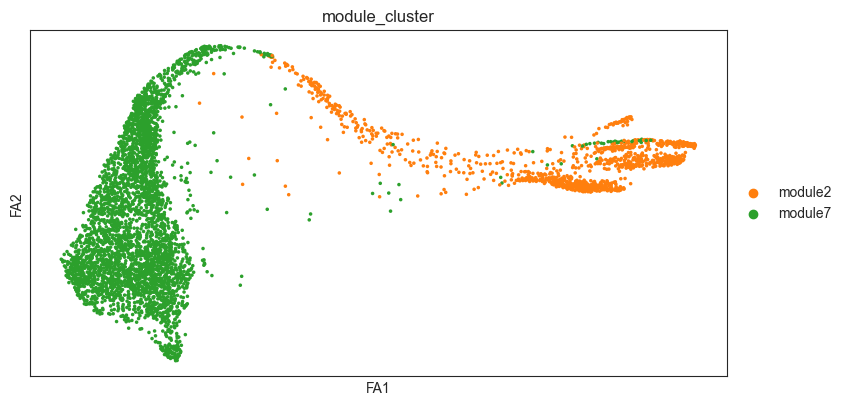

In [106]:
import scanpy as sc
%matplotlib inline
sc.tl.pca(oracle.adata)
sc.pp.neighbors(oracle.adata, n_neighbors=15, n_pcs=50)
sc.tl.draw_graph(oracle.adata)
sc.pl.draw_graph(oracle.adata, color="module_cluster")

In [107]:
sc.tl.draw_graph(oracle.adata, use_rep='X_umap', random_state=0)

In [108]:
links = oracle.get_links(cluster_name_for_GRN_unit="celltype_grouped",
                         alpha=10,
                         verbose_level=1,
                         n_jobs=1)

  0%|          | 0/1 [00:00<?, ?it/s]

In [109]:
# Network preprocessing

In [110]:
%matplotlib inline
links.filter_links(p=0.001, weight="coef_abs", threshold_number=2000)

In [111]:
plt.rcParams["figure.figsize"] = [9, 4.5]

Epithelial cells


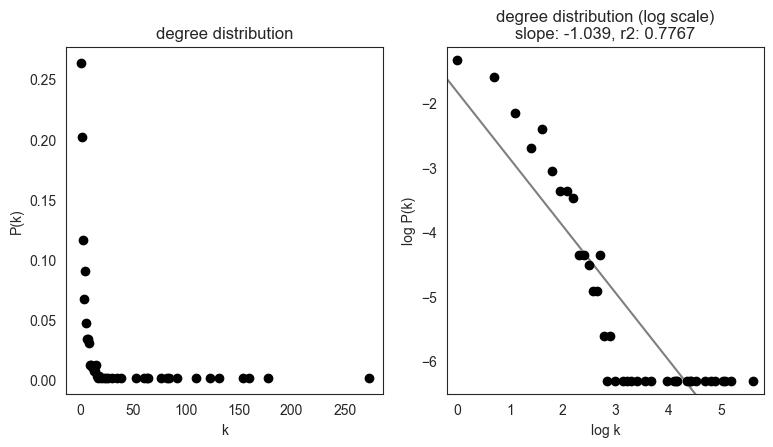

In [112]:
links.plot_degree_distributions(plot_model=True,
                                               #save=f"{save_folder}/degree_distribution/",
                                               )

In [113]:
links.get_network_score()

In [114]:
links.cluster

['Epithelial cells']

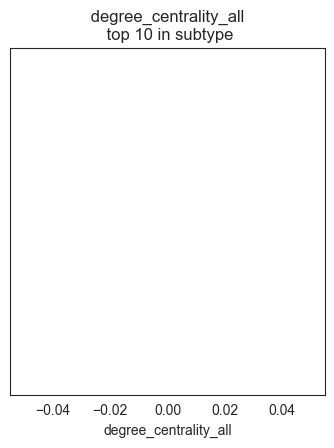

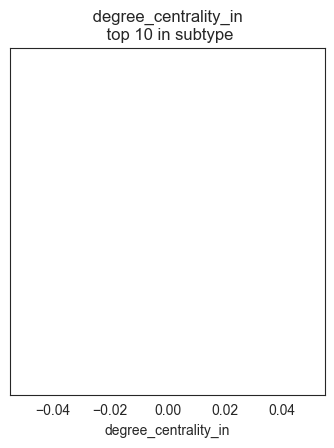

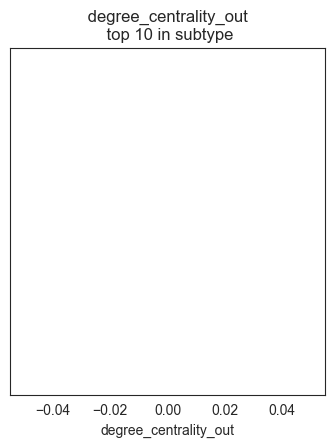

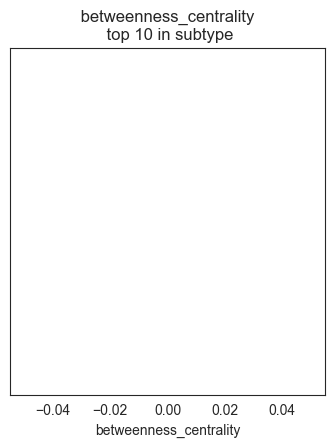

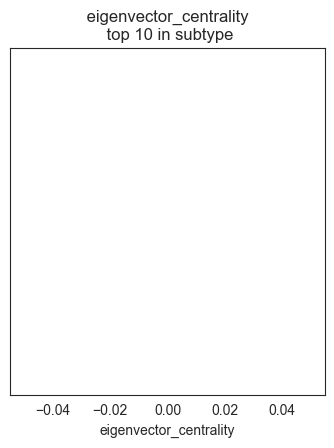

In [154]:
links.plot_scores_as_rank(cluster="subtype", n_gene=10)

In [155]:
links.filter_links()
oracle.get_cluster_specific_TFdict_from_Links(links_object=links)
oracle.fit_GRN_for_simulation(alpha=10,
                              use_cluster_specific_TFdict=True)

  0%|          | 0/1 [00:00<?, ?it/s]

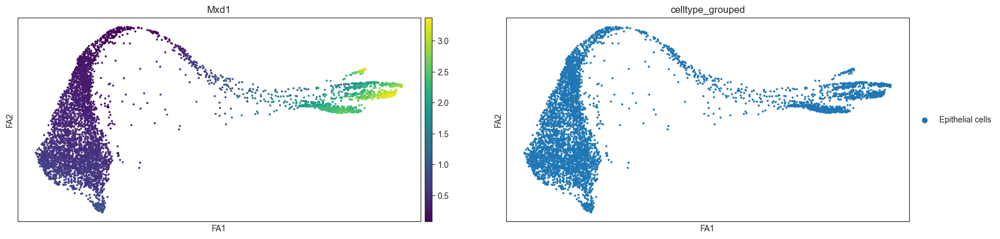

In [156]:
goi = "Mxd1"
sc.pl.draw_graph(oracle.adata, color=[goi, oracle.cluster_column_name],
                 layer="imputed_count", use_raw=False, cmap="viridis")

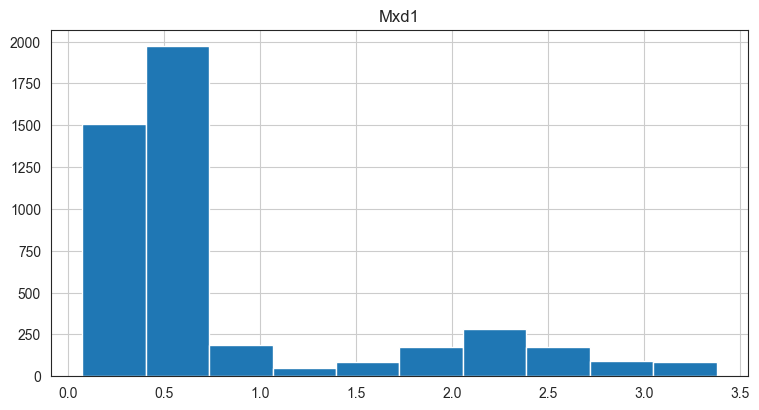

In [157]:
sc.get.obs_df(oracle.adata, keys=[goi], layer="imputed_count").hist()
plt.show()

In [158]:
oracle.simulate_shift(perturb_condition={goi: 0.0}, n_propagation=3)

In [159]:
oracle.estimate_transition_prob(n_neighbors=200, knn_random=True, sampled_fraction=1)
oracle.calculate_embedding_shift(sigma_corr=0.05)

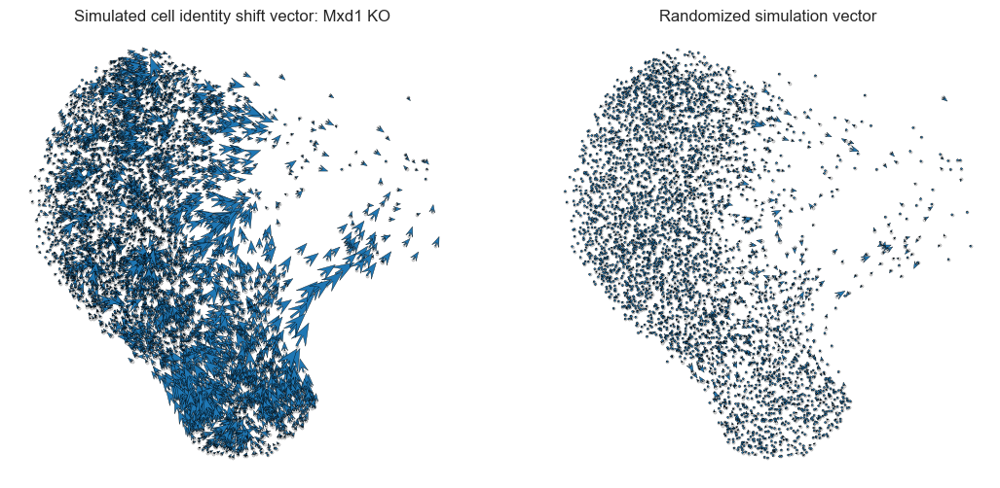

In [160]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale = 25
oracle.plot_quiver(scale=scale, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")
oracle.plot_quiver_random(scale=scale, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

In [161]:
n_grid = 50
oracle.calculate_p_mass(smooth=2, n_grid=n_grid, n_neighbors=200)

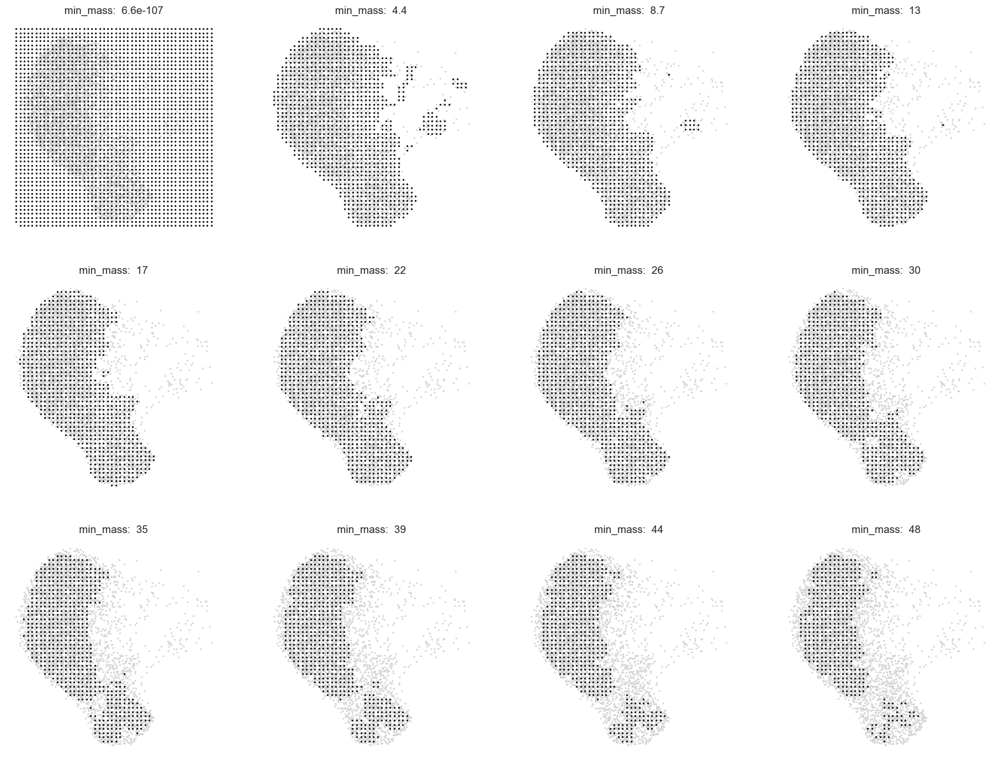

In [162]:
# Search for best min_mass.
oracle.suggest_mass_thresholds(n_suggestion=12)

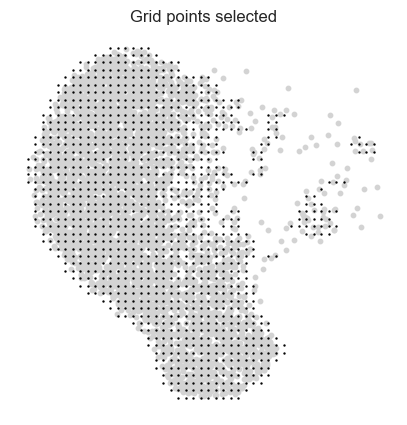

In [163]:
min_mass = 4.5
oracle.calculate_mass_filter(min_mass=min_mass, plot=True)

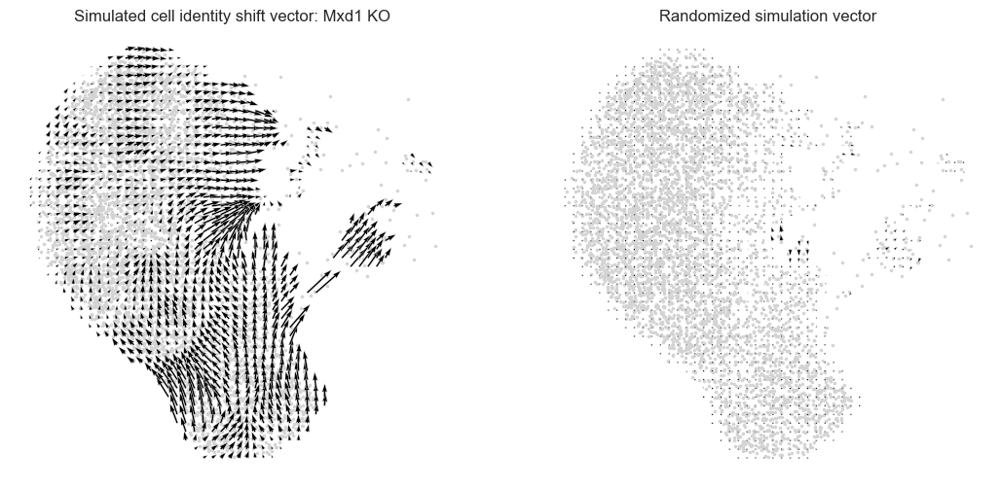

In [164]:
fig, ax = plt.subplots(1, 2,  figsize=[13, 6])

scale_simulation = 15
# Show quiver plot
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax[0])
ax[0].set_title(f"Simulated cell identity shift vector: {goi} KO")

# Show quiver plot that was calculated with randomized graph.
oracle.plot_simulation_flow_random_on_grid(scale=scale_simulation, ax=ax[1])
ax[1].set_title(f"Randomized simulation vector")

plt.show()

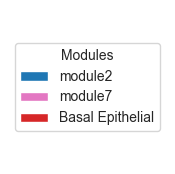

In [165]:
import matplotlib.pyplot as plt
from matplotlib.patches import Patch

palette = {
    'module2': '#1F77B4',
    'module7': '#E377C2',
    'Basal Epithelial': '#D62728'
}

handles = [Patch(facecolor=palette[m], label=m) for m in ['module2', 'module7', 'Basal Epithelial']]
fig, ax = plt.subplots(figsize=(2, 2))
ax.axis('off')  # 축 제거
legend = ax.legend(handles=handles, frameon=True, title='Modules', loc='center')

plt.show()

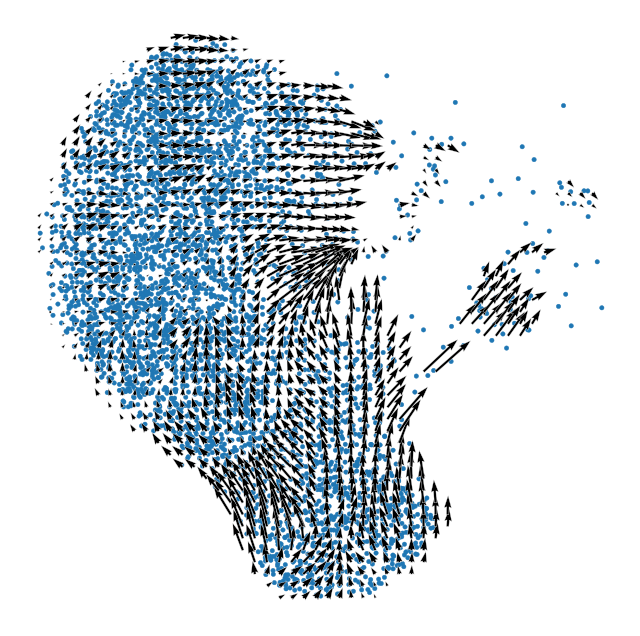

In [166]:
fig, ax = plt.subplots(figsize=[8, 8])

oracle.plot_cluster_whole(ax=ax, s=10)
oracle.plot_simulation_flow_on_grid(scale=scale_simulation, ax=ax, show_background=False)

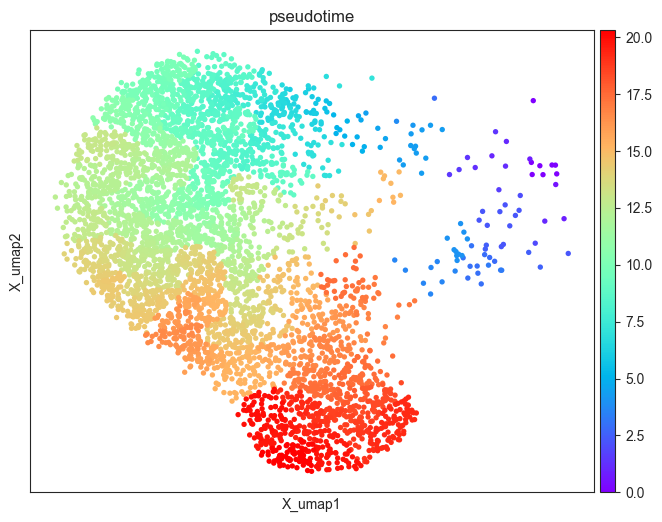

In [167]:
fig, ax = plt.subplots(figsize=[8,6])

sc.pl.embedding(adata=oracle.adata, basis=oracle.embedding_name, ax=ax, cmap="rainbow", s = 60, color=["pseudotime"])

In [168]:
from celloracle.applications import Gradient_calculator

gradient = Gradient_calculator(oracle_object=oracle, pseudotime_key="pseudotime")

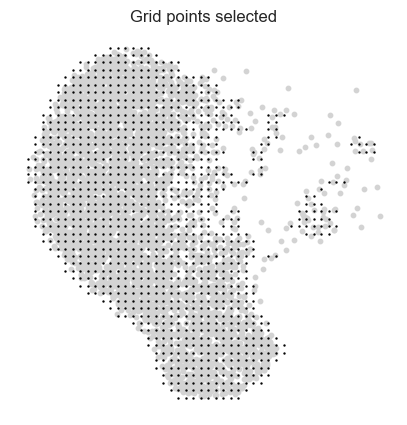

In [169]:
gradient.calculate_p_mass(smooth=0.8, n_grid=n_grid, n_neighbors=200)
gradient.calculate_mass_filter(min_mass=min_mass, plot=True)

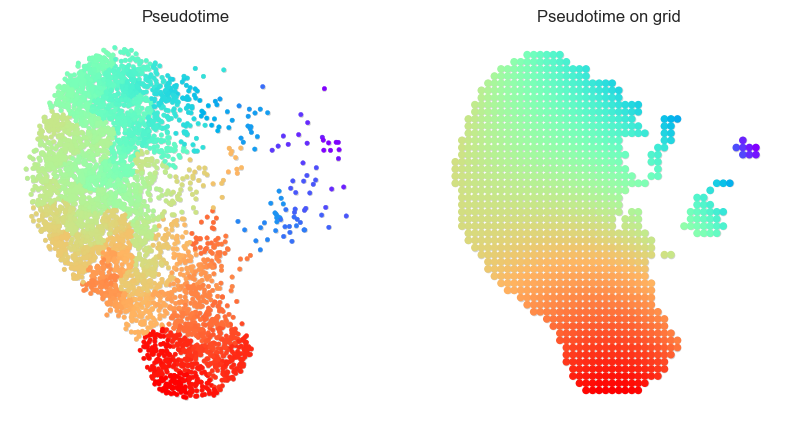

In [170]:
gradient.transfer_data_into_grid(args={"method": "polynomial", "n_poly":3}, plot=True)

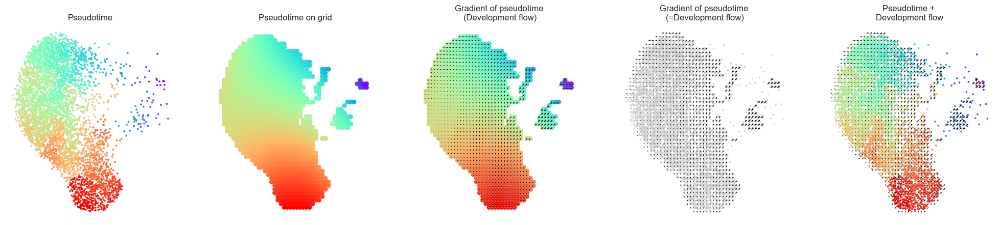

In [171]:
gradient.calculate_gradient()

scale_dev = 60
gradient.visualize_results(scale=scale_dev, s=5)

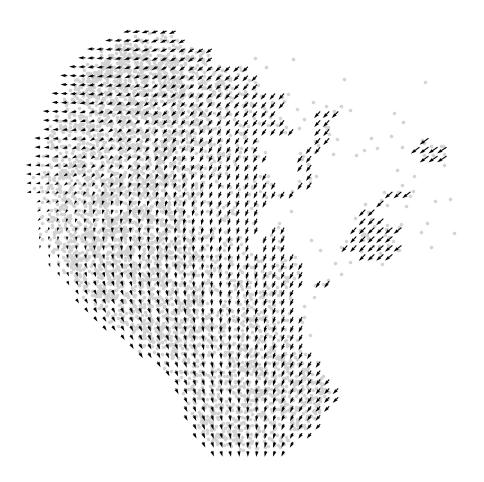

In [172]:
fig, ax = plt.subplots(figsize=[6, 6])
gradient.plot_dev_flow_on_grid(scale=scale_dev, ax=ax)

In [173]:
from celloracle.applications import Oracle_development_module

dev = Oracle_development_module()
dev.load_differentiation_reference_data(gradient_object=gradient)
dev.load_perturb_simulation_data(oracle_object=oracle)
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

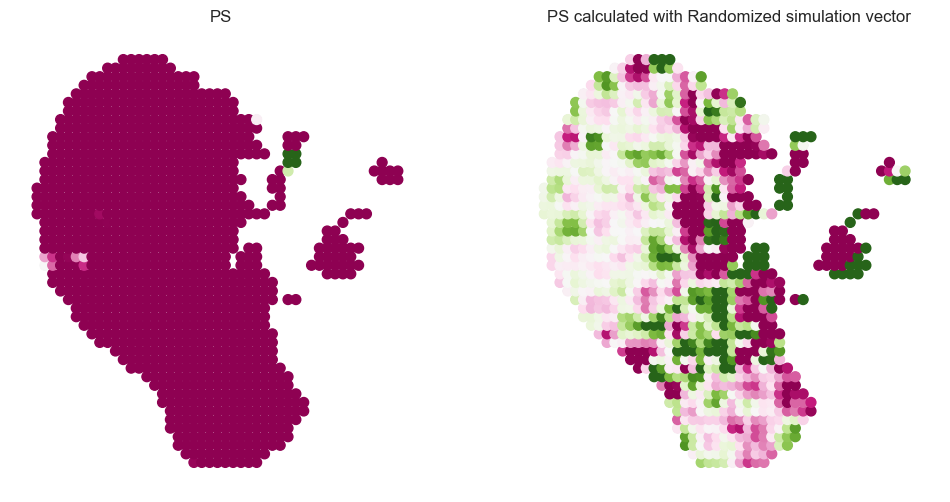

In [174]:
vm = 0.02

fig, ax = plt.subplots(1, 2, figsize=[12, 6])
dev.plot_inner_product_on_grid(vm=0.02, s=50, ax=ax[0])
ax[0].set_title(f"PS")

dev.plot_inner_product_random_on_grid(vm=vm, s=50, ax=ax[1])
ax[1].set_title(f"PS calculated with Randomized simulation vector")
plt.show()

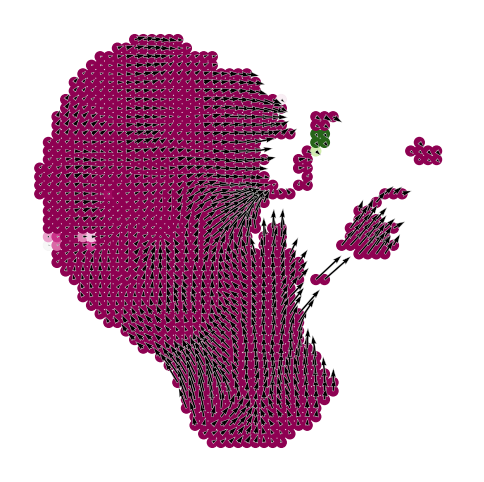

In [175]:
fig, ax = plt.subplots(figsize=[6, 6])
dev.plot_inner_product_on_grid(vm=vm, s=50, ax=ax)
dev.plot_simulation_flow_on_grid(scale=scale_simulation, show_background=False, ax=ax)

2026-03-02 16:22:11,316 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2026-03-02 16:22:11,322 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


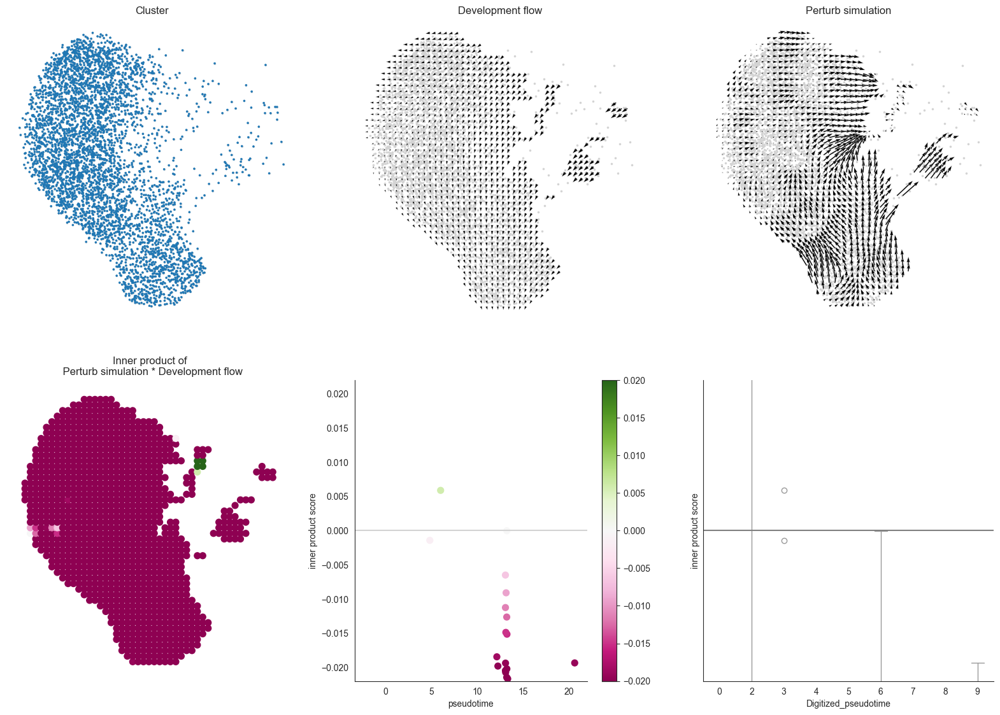

In [176]:
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm)

In [177]:
clusters = ['Aged','Young']
cell_idx = np.where(oracle.adata.obs["age_group"].isin(clusters))[0]

In [178]:
dev = Oracle_development_module()

dev.load_differentiation_reference_data(gradient_object=gradient)
dev.load_perturb_simulation_data(oracle_object=oracle, cell_idx_use=cell_idx, name="Lineage_MEP")
dev.calculate_inner_product()
dev.calculate_digitized_ip(n_bins=10)

2026-03-02 16:22:12,432 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2026-03-02 16:22:12,438 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


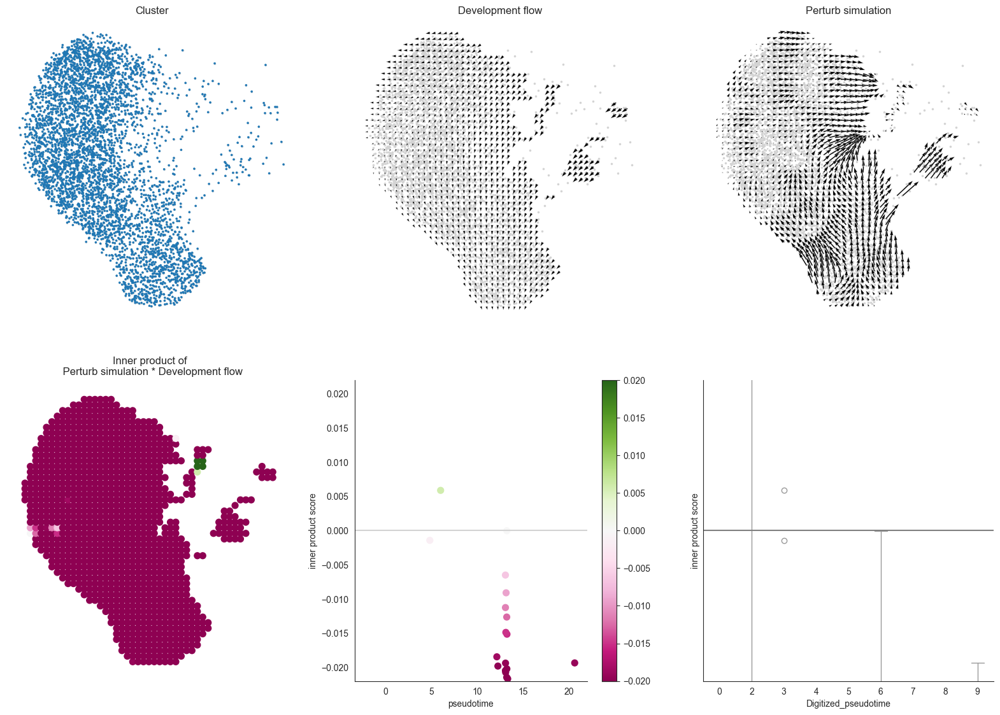

In [179]:
dev.visualize_development_module_layout_0(s=5,
                                          scale_for_simulation=scale_simulation,
                                          s_grid=50,
                                          scale_for_pseudotime=scale_dev,
                                          vm=vm)

Mxd1


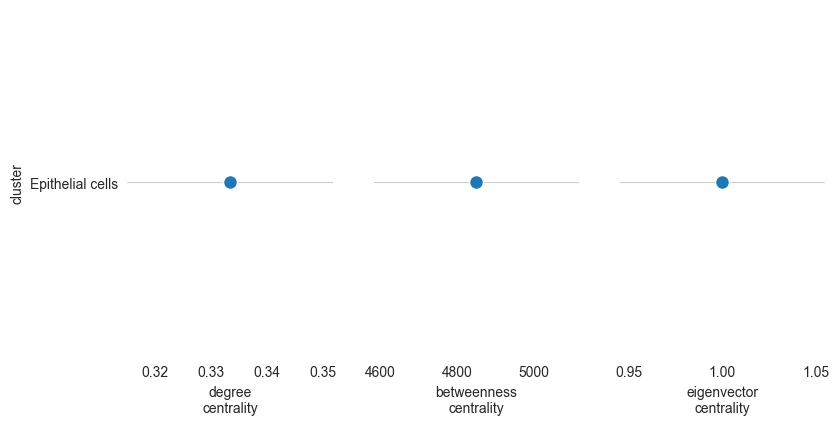

In [180]:
links.plot_score_per_cluster(goi="Mxd1")

In [181]:
cluster_name = "Epithelial cells"
filtered_links_df = links.filtered_links[cluster_name]
filtered_links_df[filtered_links_df['target'] == 'Muc4']

,source,target,coef_mean,coef_abs,p,-logp
4877,Mxd1,Muc4,0.629422,0.629422,8.493848e-10,9.070896
4879,Foxc1,Muc4,-0.336537,0.336537,5.204903e-07,6.283587
4874,Fosl1,Muc4,0.223857,0.223857,2.080054e-06,5.681925
4876,Lmo4,Muc4,0.217093,0.217093,6.033562e-07,6.219426
4880,Hif1a,Muc4,0.182699,0.182699,7.216795e-07,6.141656
4875,Tead1,Muc4,0.090021,0.090021,2.269213e-05,4.644125


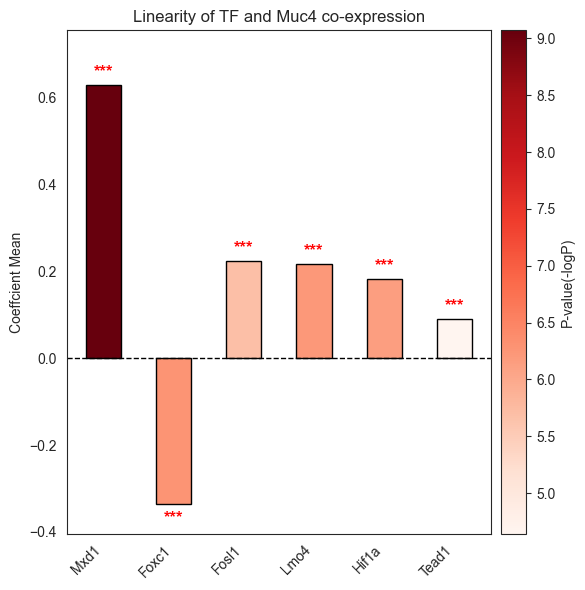

In [182]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.colors import Normalize
import matplotlib.cm as cm

clusters = ["Epithelial cells"]
target_gene = "Muc4"

dfs = []
for cl in clusters:
    df = links.filtered_links[cl]
    df = df[df["target"] == target_gene].copy()
    df["cluster"] = cl
    dfs.append(df)

plot_df = pd.concat(dfs, ignore_index=True)
plot_df = plot_df.reset_index(drop=True)

plot_df["x"] = plot_df.groupby("cluster").cumcount()
plot_df["x"] += plot_df["cluster"].map(
    plot_df.groupby("cluster").size().cumsum().shift(fill_value=0)
)

norm = Normalize(vmin=plot_df["-logp"].min(), vmax=plot_df["-logp"].max())
cmap = cm.Reds

fig, ax = plt.subplots(figsize=(6, 6))

bars = ax.bar(
    plot_df["x"],
    plot_df["coef_mean"],
    width=0.5,
    color=cmap(norm(plot_df["-logp"])),
    edgecolor="black",
    linewidth=1
)

ax.axhline(0, color="black", linestyle="--", linewidth=1)

def get_star(p):
    if p < 0.001:
        return "***"
    elif p < 0.01:
        return "**"
    elif p < 0.05:
        return "*"
    else:
        return ""

for i, row in plot_df.iterrows():
    star = get_star(row["p"])
    if star != "":
        y = row["coef_mean"]
        offset = 0.02 * abs(plot_df["coef_mean"].max())
        ax.text(
            row["x"],
            y + offset if y >= 0 else y - offset,
            star,
            ha="center",
            va="bottom" if y >= 0 else "top",
            fontsize=12,
            fontweight="bold",
            color="red"
        )

ax.set_xticks(plot_df["x"])
ax.set_xticklabels(plot_df["source"], rotation=45, ha="right")
ax.set_ylabel("Coeffcient Mean")
ax.set_title(f"Linearity of TF and {target_gene} co-expression")

ymax = plot_df["coef_mean"].max()
ymin = plot_df["coef_mean"].min()
ax.set_ylim(ymin * 1.2, ymax * 1.2)

sm = cm.ScalarMappable(norm=norm, cmap=cmap)
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label("P-value(-logP)")

plt.tight_layout()
plt.show()

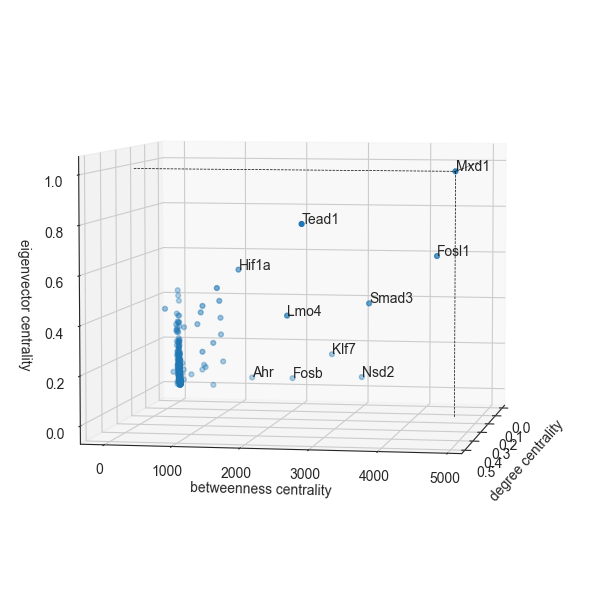

In [183]:
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
import numpy as np

df = links.merged_score
df = df[df["cluster"] == "Epithelial cells"]

x = df["degree_centrality_all"].values
y = df["betweenness_centrality"].values
z = df["eigenvector_centrality"].values
names = df.index.values

dist = np.sqrt(x**2 + y**2 + z**2)
top_idx = np.argsort(dist)[-10:]

fig = plt.figure(figsize=(8,6))
ax = fig.add_subplot(111, projection="3d")

ax.scatter(x, y, z, s=12)

for i in top_idx:
    ax.text(x[i], y[i], z[i], names[i])

mxd1_idx = np.where(names == "Mxd1")[0][0]

ax.plot([x[mxd1_idx], x[mxd1_idx]], [y[mxd1_idx], y[mxd1_idx]], [0, z[mxd1_idx]], 'k--', linewidth=0.5)
ax.plot([x[mxd1_idx], x[mxd1_idx]], [0, y[mxd1_idx]], [z[mxd1_idx], z[mxd1_idx]], 'k--', linewidth=0.5)
ax.plot([0, x[mxd1_idx]], [y[mxd1_idx], y[mxd1_idx]], [z[mxd1_idx], z[mxd1_idx]], 'k--', linewidth=0.5)

ax.set_xlabel("degree centrality")
ax.set_ylabel("betweenness centrality")
ax.set_zlabel("eigenvector centrality")

ax.view_init(elev=5, azim=10)
plt.tight_layout()
plt.show()

# Statistic test

2026-03-02 16:22:30,773 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2026-03-02 16:22:30,779 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


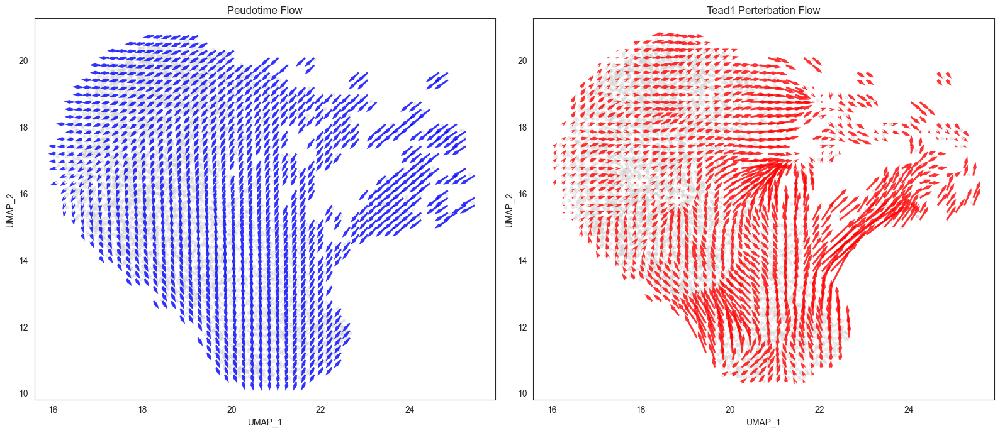

In [184]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.spatial import cKDTree

plt.ioff()
fig = dev.visualize_development_module_layout_0(
    s=5,
    scale_for_simulation=scale_simulation,
    s_grid=50,
    scale_for_pseudotime=scale_dev,
    vm=vm
)
plt.close(fig)
plt.ion()

cell_coordinates = dev.embedding
grid_coordinates = dev.gridpoints_coordinates
ref_flow_grid = dev.ref_flow
flow_grid = dev.flow

tree = cKDTree(cell_coordinates)
distances, _ = tree.query(grid_coordinates, k=1)
threshold = np.percentile(distances, 50)
mask = distances < threshold

filtered_grid_coords = grid_coordinates[mask]
filtered_ref_flow = ref_flow_grid[mask]
filtered_sim_flow = flow_grid[mask]

ref_magnitude = np.sqrt(filtered_ref_flow[:, 0]**2 + filtered_ref_flow[:, 1]**2)
sim_magnitude = np.sqrt(filtered_sim_flow[:, 0]**2 + filtered_sim_flow[:, 1]**2)

ref_scale = np.median(ref_magnitude)
sim_scale = np.median(sim_magnitude)

scale_factor = ref_scale / sim_scale if sim_scale > 0 else 1
filtered_sim_flow_scaled = filtered_sim_flow * scale_factor

fig, axes = plt.subplots(1, 2, figsize=(16, 7))

axes[0].scatter(cell_coordinates[:, 0], cell_coordinates[:, 1], c='lightgray', s=10, alpha=0.4)
axes[0].quiver(filtered_grid_coords[:, 0], filtered_grid_coords[:, 1],
               filtered_ref_flow[:, 0], filtered_ref_flow[:, 1],
               alpha=0.8, scale=40, width=0.004, color='blue',
               headwidth=2, headlength=3, headaxislength=4.5)
axes[0].set_title('Peudotime Flow')
axes[0].set_xlabel('UMAP_1')
axes[0].set_ylabel('UMAP_2')

axes[1].scatter(cell_coordinates[:, 0], cell_coordinates[:, 1], c='lightgray', s=10, alpha=0.4)
axes[1].quiver(filtered_grid_coords[:, 0], filtered_grid_coords[:, 1],
               filtered_sim_flow_scaled[:, 0], filtered_sim_flow_scaled[:, 1],
               alpha=0.8, scale=40, width=0.004, color='red',
               headwidth=2, headlength=3, headaxislength=4.5)
axes[1].set_title('Tead1 Perterbation Flow')
axes[1].set_xlabel('UMAP_1')
axes[1].set_ylabel('UMAP_2')

plt.tight_layout()
plt.show()

2026-03-02 16:22:31,361 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2026-03-02 16:22:31,367 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


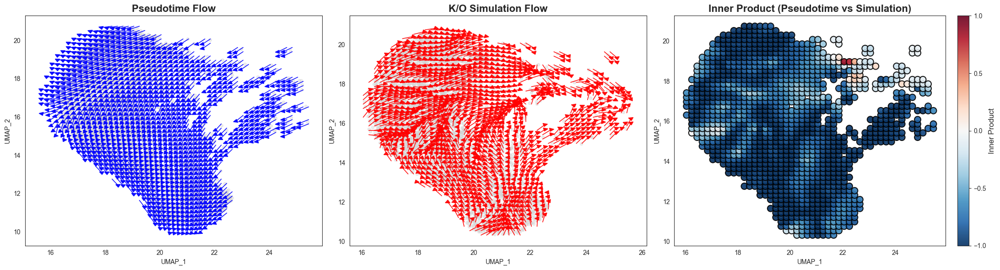

In [185]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
import matplotlib.patches as patches
import warnings
warnings.filterwarnings("ignore")

plt.ioff()
fig = dev.visualize_development_module_layout_0(
    s=5,
    scale_for_simulation=scale_simulation,
    s_grid=15,
    scale_for_pseudotime=scale_dev,
    vm=vm
)
plt.close(fig)
plt.ion()

cell_coordinates = dev.embedding
grid_coordinates = dev.gridpoints_coordinates
ref_flow_grid = dev.ref_flow
flow_grid = dev.flow

tree = cKDTree(cell_coordinates)
distances, _ = tree.query(grid_coordinates, k=1)
threshold = np.percentile(distances, 50)
mask = distances < threshold

filtered_grid_coords = grid_coordinates[mask]
filtered_ref_flow = ref_flow_grid[mask]
filtered_sim_flow = flow_grid[mask]

ref_norm = np.linalg.norm(filtered_ref_flow, axis=1)
sim_norm = np.linalg.norm(filtered_sim_flow, axis=1)

ref_unit = np.zeros_like(filtered_ref_flow)
sim_unit = np.zeros_like(filtered_sim_flow)

mask_ref = ref_norm > 1e-6
mask_sim = sim_norm > 1e-6

ref_unit[mask_ref] = filtered_ref_flow[mask_ref] / ref_norm[mask_ref, None]
sim_unit[mask_sim] = filtered_sim_flow[mask_sim] / sim_norm[mask_sim, None]

dot = np.sum(ref_unit * sim_unit, axis=1)
valid = mask_ref & mask_sim

fig, axes = plt.subplots(1, 3, figsize=(22, 6))

arrow_hw = 0.10
head_radius = arrow_hw
head_offset = 0.4

ax1 = axes[0]
ax1.scatter(cell_coordinates[:, 0], cell_coordinates[:, 1], c='lightgray', s=20, alpha=0.4)
for i in range(len(filtered_grid_coords)):
    if mask_ref[i]:
        ux, uy = ref_unit[i]
        angle = np.arctan2(uy, ux)
        cx = filtered_grid_coords[i, 0] + ux * head_offset
        cy = filtered_grid_coords[i, 1] + uy * head_offset
        ax1.plot([filtered_grid_coords[i, 0], cx], [filtered_grid_coords[i, 1], cy], 
                linewidth=1.2, color="blue", alpha=0.9)
        tri = patches.RegularPolygon((cx, cy), numVertices=3, radius=head_radius, 
                                    orientation=angle, facecolor="blue", edgecolor="blue", alpha=0.9)
        ax1.add_patch(tri)
ax1.set_title("Pseudotime Flow", fontsize=16, fontweight='bold')
ax1.set_xlabel("UMAP_1")
ax1.set_ylabel("UMAP_2")

ax2 = axes[1]
ax2.scatter(cell_coordinates[:, 0], cell_coordinates[:, 1], c='lightgray', s=20, alpha=0.4)
for i in range(len(filtered_grid_coords)):
    if mask_sim[i]:
        ux, uy = sim_unit[i]
        angle = np.arctan2(uy, ux)
        cx = filtered_grid_coords[i, 0] + ux * head_offset
        cy = filtered_grid_coords[i, 1] + uy * head_offset
        ax2.plot([filtered_grid_coords[i, 0], cx], [filtered_grid_coords[i, 1], cy], 
                linewidth=1.2, color="red", alpha=0.9)
        tri = patches.RegularPolygon((cx, cy), numVertices=3, radius=head_radius, 
                                    orientation=angle, facecolor="red", edgecolor="red", alpha=0.9)
        ax2.add_patch(tri)
ax2.set_title("K/O Simulation Flow", fontsize=16, fontweight='bold')
ax2.set_xlabel("UMAP_1")
ax2.set_ylabel("UMAP_2")

ax3 = axes[2]
ax3.scatter(cell_coordinates[:, 0], cell_coordinates[:, 1], c='lightgray', s=20, alpha=0.4)
sc3 = ax3.scatter(
    filtered_grid_coords[valid, 0], filtered_grid_coords[valid, 1],
    s=100, c=dot[valid], cmap="RdBu_r",
    vmin=-1, vmax=1,
    edgecolors="black", linewidth=1.5, alpha=0.9
)
ax3.set_title("Inner Product (Pseudotime vs Simulation)", fontsize=16, fontweight='bold')
ax3.set_xlabel("UMAP_1")
ax3.set_ylabel("UMAP_2")

cbar = plt.colorbar(sc3, ax=ax3, fraction=0.046, pad=0.04)
cbar.set_label("Inner Product", fontsize=12)
cbar.set_ticks([-1, -0.5, 0, 0.5, 1])

plt.tight_layout()
plt.show()

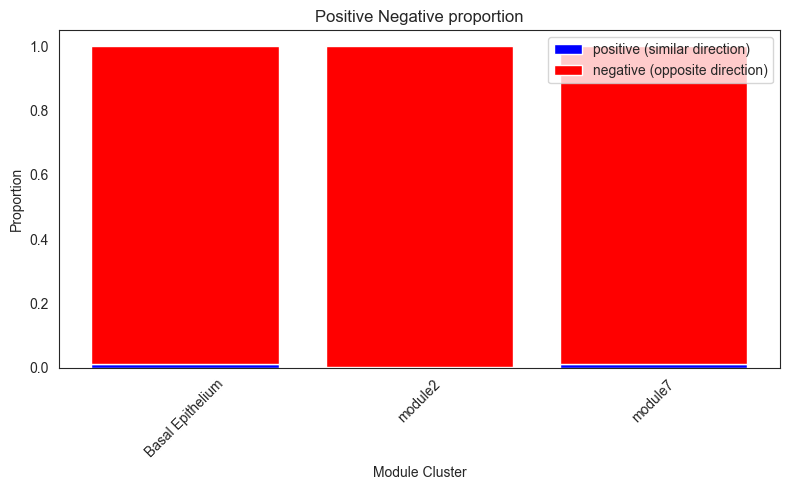

In [186]:
if 'module_cluster' in total_adata.obs.columns:
    grid_cell_indices = []
    cell_tree = cKDTree(cell_coordinates)
    for grid_point in filtered_grid_coords:
        idx = cell_tree.query_ball_point(grid_point, r=0.5)
        grid_cell_indices.append(idx)
    
    clusters = total_adata.obs["module_cluster"].unique()
    clusters = clusters[clusters != "Glandular Epithelium"]

    pos_frac = []
    neg_frac = []
    
    for cl in clusters:
        mask_cells = total_adata.obs["module_cluster"] == cl
        mask_grid = []
        for idx in grid_cell_indices:
            if len(idx) > 0 and np.any(mask_cells.iloc[idx]):
                mask_grid.append(True)
            else:
                mask_grid.append(False)
        mask_grid = np.array(mask_grid) & valid
        
        if np.sum(mask_grid) == 0:
            pos_frac.append(0.0)
            neg_frac.append(0.0)
        else:
            pos_frac.append(np.mean(dot[mask_grid] > 0))
            neg_frac.append(np.mean(dot[mask_grid] < 0))
    
    x = np.arange(len(clusters))
    pos_arr = np.array(pos_frac)
    neg_arr = np.array(neg_frac)
    
    plt.figure(figsize=(8, 5))
    plt.bar(x, pos_arr, color="blue", label="positive (similar direction)")
    plt.bar(x, neg_arr, bottom=pos_arr, color="red", label="negative (opposite direction)")
    plt.xticks(x, clusters.astype(str), rotation=45)
    plt.ylabel("Proportion")
    plt.xlabel("Module Cluster")
    plt.title("Positive Negative proportion")
    plt.legend()
    plt.tight_layout()
    plt.show()

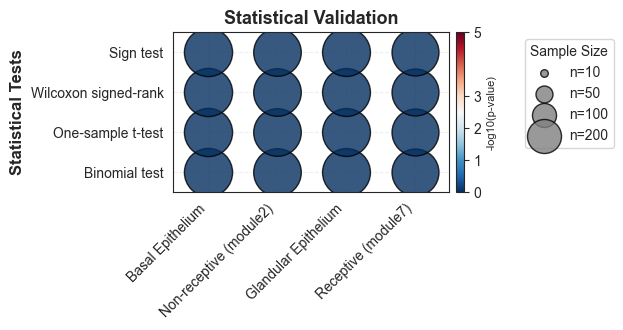

In [190]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

valid_dots = dot[valid]

clusters = total_adata.obs["module_cluster"].unique()

cluster_rename = {
    "module2": "Non-receptive (module2)",
    "module7": "Receptive (module7)"
}

clusters = np.array([cluster_rename.get(cl, cl) for cl in clusters])

results = {
    'Binomial test': [],
    'One-sample t-test': [],
    'Wilcoxon signed-rank': [],
    'Sign test': []
}

sample_sizes = []

for cl in total_adata.obs["module_cluster"].unique():
    mask_cells = total_adata.obs["module_cluster"] == cl
    
    mask_grid = []
    for idx in grid_cell_indices:
        if len(idx) > 0 and np.any(mask_cells.iloc[idx]):
            mask_grid.append(True)
        else:
            mask_grid.append(False)
    
    mask_grid = np.array(mask_grid) & valid
    cluster_dots = dot[mask_grid]
    sample_sizes.append(len(cluster_dots))
    
    if len(cluster_dots) < 3:
        results['Binomial test'].append(np.nan)
        results['One-sample t-test'].append(np.nan)
        results['Wilcoxon signed-rank'].append(np.nan)
        results['Sign test'].append(np.nan)
        continue
    
    n_pos = np.sum(cluster_dots > 0)
    n_tot = len(cluster_dots)
    
    binom = stats.binomtest(n_tot - n_pos, n_tot, p=0.5, alternative='less')
    results['Binomial test'].append(binom.pvalue)
    
    _, t_pval = stats.ttest_1samp(cluster_dots, 0, alternative='greater')
    results['One-sample t-test'].append(t_pval)
    
    try:
        _, w_pval = stats.wilcoxon(cluster_dots, alternative='greater')
        results['Wilcoxon signed-rank'].append(w_pval)
    except:
        results['Wilcoxon signed-rank'].append(np.nan)
    
    sign = stats.binomtest(n_pos, n_tot, p=0.5, alternative='greater')
    results['Sign test'].append(sign.pvalue)

test_names = list(results.keys())
n_tests = len(test_names)
n_clusters = len(clusters)

fig, ax = plt.subplots(figsize=(n_clusters * 0.6 + 4, n_tests * 0.6 + 1))

for i, test_name in enumerate(test_names):
    for j in range(n_clusters):
        pval = results[test_name][j]
        size = sample_sizes[j]
        
        if np.isnan(pval):
            continue
        
        log_pval = -np.log10(pval)
        norm_val = np.clip(log_pval / 5, 0, 1)
        color = plt.cm.RdBu_r(norm_val)
        
        scatter_size = size * 1
        
        ax.scatter(
            j, i,
            s=scatter_size,
            c=[color],
            edgecolors='black',
            linewidth=1,
            alpha=0.8
        )

ax.set_xticks(range(n_clusters))
ax.set_xticklabels(clusters.astype(str), rotation=45, ha='right')
ax.set_yticks(range(n_tests))
ax.set_yticklabels(test_names)

ax.set_ylabel('Statistical Tests', fontsize=12, fontweight='bold')
ax.set_title('Statistical Validation', fontsize=13, fontweight='bold')

ax.grid(alpha=0.3, linestyle='--')
ax.set_xlim(-0.5, n_clusters - 0.5)
ax.set_ylim(-0.5, n_tests - 0.5)

sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=0, vmax=5))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label('-log10(p-value)', fontsize=8)
cbar.set_ticks([0, 1, 2, 3, 5])

legend_sizes = [10, 50, 100, 200]
legend_elements = [
    plt.scatter([], [], s=s * 3, c='gray', edgecolors='black',
                linewidth=1, alpha=0.8, label=f'n={s}')
    for s in legend_sizes if s <= max(sample_sizes)
]

ax.legend(
    handles=legend_elements,
    loc='upper left',
    bbox_to_anchor=(1.25, 1),
    title='Sample Size',
    frameon=True
)

plt.tight_layout()
plt.show()

2026-03-02 16:22:36,530 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.
2026-03-02 16:22:36,535 - INFO - Using categorical units to plot a list of strings that are all parsable as floats or dates. If these strings should be plotted as numbers, cast to the appropriate data type before plotting.


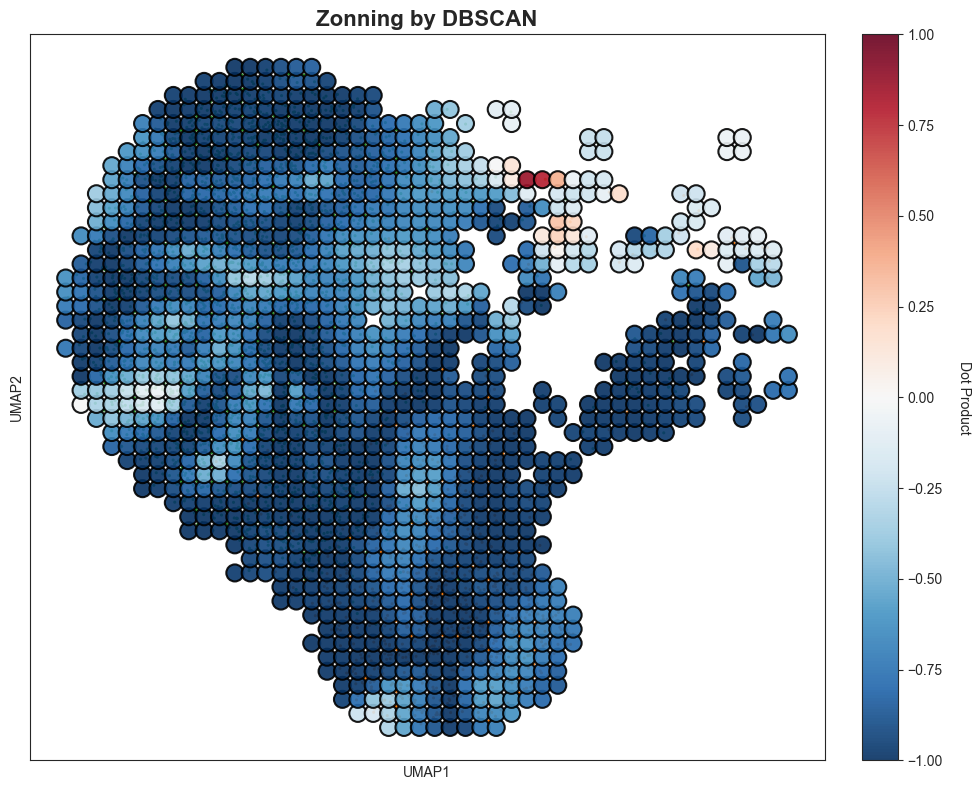

In [188]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree, ConvexHull
from sklearn.cluster import DBSCAN
import matplotlib.patches as patches
from matplotlib.patches import Patch
import warnings
warnings.filterwarnings("ignore")

if 'overlap_region' not in total_adata_subset.obs.columns:
    from sklearn.neighbors import NearestNeighbors
    
    umap_coords = total_adata_subset.obsm['X_umap']
    clusters = total_adata_subset.obs['module_cluster'].values
    
    total_adata_subset.obs['overlap_region'] = 'other'
    
    nn = NearestNeighbors(n_neighbors=20)
    nn.fit(umap_coords)
    distances, indices = nn.kneighbors(umap_coords)
    
    for i in range(len(total_adata_subset)):
        neighbor_clusters = clusters[indices[i]]
        unique_clusters = np.unique(neighbor_clusters)
        
        if len(unique_clusters) > 1:
            clusters_str = '_'.join(sorted([str(c) for c in unique_clusters[:2]]))
            if not (('2' in clusters_str and '7' in clusters_str)):
                total_adata_subset.obs.loc[total_adata_subset.obs.index[i], 'overlap_region'] = f'overlap_{clusters_str}'

plt.ioff()
fig = dev.visualize_development_module_layout_0(
    s=2,
    scale_for_simulation=scale_simulation,
    s_grid=50,
    scale_for_pseudotime=scale_dev,
    vm=vm
)
plt.close(fig)
plt.ion()

cell_coordinates = dev.embedding
grid_coordinates = dev.gridpoints_coordinates
ref_flow_grid = dev.ref_flow
flow_grid = dev.flow

tree = cKDTree(cell_coordinates)
distances, _ = tree.query(grid_coordinates, k=1)
threshold = np.percentile(distances, 50)
mask = distances < threshold

filtered_grid_coords = grid_coordinates[mask]
filtered_ref_flow = ref_flow_grid[mask]
filtered_sim_flow = flow_grid[mask]

ref_norm = np.linalg.norm(filtered_ref_flow, axis=1)
sim_norm = np.linalg.norm(filtered_sim_flow, axis=1)

ref_unit = np.zeros_like(filtered_ref_flow)
sim_unit = np.zeros_like(filtered_sim_flow)

mask_ref = ref_norm > 1e-6
mask_sim = sim_norm > 1e-6

ref_unit[mask_ref] = filtered_ref_flow[mask_ref] / ref_norm[mask_ref, None]
sim_unit[mask_sim] = filtered_sim_flow[mask_sim] / sim_norm[mask_sim, None]

dot = np.sum(ref_unit * sim_unit, axis=1)
valid = mask_ref & mask_sim

grid_cell_indices = []
cell_tree = cKDTree(cell_coordinates)
for grid_point in filtered_grid_coords:
    idx = cell_tree.query_ball_point(grid_point, r=0.5)
    grid_cell_indices.append(idx)

grid_overlap_labels = []
overlap_threshold = 0.2

for idx_list in grid_cell_indices:
    if len(idx_list) == 0:
        grid_overlap_labels.append('other')
        continue
    overlap_regions = total_adata_subset.obs['overlap_region'].iloc[idx_list].values
    unique, counts = np.unique(overlap_regions, return_counts=True)
    total = len(overlap_regions)
    
    voted_label = 'other'
    max_ratio = 0
    for label, count in zip(unique, counts):
        if label != 'other' and count / total > overlap_threshold:
            if count / total > max_ratio:
                max_ratio = count / total
                voted_label = label
    grid_overlap_labels.append(voted_label)

grid_overlap_labels = np.array(grid_overlap_labels)

unique_overlaps = np.unique(grid_overlap_labels)
overlap_types = [o for o in unique_overlaps if o != 'other' and not ('2' in o and '7' in o)]

colors = ['red', 'blue', 'green', 'orange', 'purple']

fig, ax = plt.subplots(1, 1, figsize=(10, 8))

sc.pl.umap(total_adata_subset, color="module_cluster", ax=ax, show=False, size=20, legend_loc="none")
sc3 = ax.scatter(
    filtered_grid_coords[valid, 0], filtered_grid_coords[valid, 1],
    s=150, c=dot[valid], cmap="RdBu_r",
    vmin=-1, vmax=1,
    edgecolors="black", linewidth=1.5, alpha=0.9, zorder=150
)

legend_elements = []

for overlap_type, color in zip(overlap_types[:len(colors)], colors):
    overlap_mask = (grid_overlap_labels == overlap_type) & valid
    if np.sum(overlap_mask) > 2:
        overlap_coords = filtered_grid_coords[overlap_mask]
        
        clustering = DBSCAN(eps=2.0, min_samples=2).fit(overlap_coords)
        labels = clustering.labels_
        
        cluster_sizes = []
        for cluster_id in np.unique(labels):
            if cluster_id == -1:
                continue
            cluster_mask = labels == cluster_id
            cluster_sizes.append((cluster_id, np.sum(cluster_mask)))
        
        if len(cluster_sizes) == 0:
            continue
            
        cluster_sizes.sort(key=lambda x: x[1], reverse=True)
        largest_cluster = cluster_sizes[0][0]
        
        cluster_mask = labels == largest_cluster
        cluster_coords = overlap_coords[cluster_mask]
        
        if len(cluster_coords) > 2:
            try:
                hull = ConvexHull(cluster_coords)
                hull_points = cluster_coords[hull.vertices]
                hull_points = np.vstack([hull_points, hull_points[0]])
                ax.plot(hull_points[:, 0], hull_points[:, 1], 
                       color=color, linewidth=3, alpha=0.8, zorder=200)
                
                centroid = np.mean(cluster_coords, axis=0)
                ax.text(centroid[0], centroid[1], overlap_type, 
                       fontsize=10, fontweight='bold', ha='center', va='center',
                       bbox=dict(boxstyle='round,pad=0.5', facecolor='white', 
                               edgecolor=color, linewidth=2, alpha=0.9), zorder=250)
                
                legend_elements.append(Patch(facecolor=color, edgecolor=color, 
                                            label=overlap_type, alpha=0.8))
            except:
                pass

if legend_elements:
    ax.legend(handles=legend_elements, loc='upper left', fontsize=12, framealpha=0.9)

ax.set_title("Zonning by DBSCAN", fontsize=16, fontweight='bold')

cbar = plt.colorbar(sc3, ax=ax, fraction=0.1, pad=0.04)
cbar.set_label('Dot Product', rotation=270, labelpad=20)

plt.tight_layout()
plt.show()

pos_counts = []
neg_counts = []
region_names = []

for overlap_type in overlap_types:
    overlap_mask = (grid_overlap_labels == overlap_type) & valid
    if np.sum(overlap_mask) > 2:
        overlap_coords = filtered_grid_coords[overlap_mask]
        
        clustering = DBSCAN(eps=2.0, min_samples=2).fit(overlap_coords)
        labels = clustering.labels_
        
        cluster_sizes = []
        for cluster_id in np.unique(labels):
            if cluster_id == -1:
                continue
            cluster_mask = labels == cluster_id
            cluster_sizes.append((cluster_id, np.sum(cluster_mask)))
        
        if len(cluster_sizes) == 0:
            continue
            
        cluster_sizes.sort(key=lambda x: x[1], reverse=True)
        largest_cluster = cluster_sizes[0][0]
        
        cluster_mask = labels == largest_cluster
        overlap_indices = np.where(overlap_mask)[0]
        largest_cluster_indices = overlap_indices[cluster_mask]
        
        if len(largest_cluster_indices) > 0:
            cluster_dots = dot[largest_cluster_indices]
            pos_count = np.sum(cluster_dots > 0)
            neg_count = np.sum(cluster_dots < 0)
            
            pos_counts.append(pos_count)
            neg_counts.append(neg_count)
            region_names.append(overlap_type)

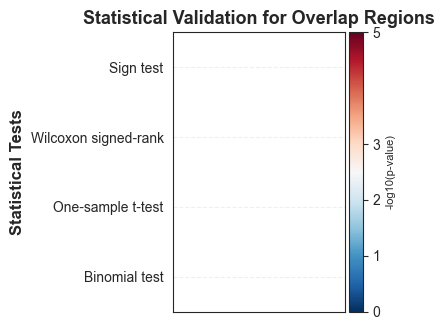

In [189]:
import numpy as np
from scipy import stats
import matplotlib.pyplot as plt

valid_dots = dot[valid]
overlap_regions = [o for o in overlap_types]

results = {
    'Binomial test': [],
    'One-sample t-test': [],
    'Wilcoxon signed-rank': [],
    'Sign test': []
}
sample_sizes = []

for overlap_type in overlap_regions:
    overlap_mask = (grid_overlap_labels == overlap_type) & valid
    
    if np.sum(overlap_mask) > 2:
        overlap_coords = filtered_grid_coords[overlap_mask]
        
        clustering = DBSCAN(eps=2.0, min_samples=2).fit(overlap_coords)
        labels = clustering.labels_
        
        cluster_sizes = []
        for cluster_id in np.unique(labels):
            if cluster_id == -1:
                continue
            cluster_mask = labels == cluster_id
            cluster_sizes.append((cluster_id, np.sum(cluster_mask)))
        
        if len(cluster_sizes) == 0:
            results['Binomial test'].append(np.nan)
            results['One-sample t-test'].append(np.nan)
            results['Wilcoxon signed-rank'].append(np.nan)
            results['Sign test'].append(np.nan)
            sample_sizes.append(0)
            continue
            
        cluster_sizes.sort(key=lambda x: x[1], reverse=True)
        largest_cluster = cluster_sizes[0][0]
        
        cluster_mask = labels == largest_cluster
        overlap_indices = np.where(overlap_mask)[0]
        largest_cluster_indices = overlap_indices[cluster_mask]
        
        if len(largest_cluster_indices) > 0:
            cluster_dots = dot[largest_cluster_indices]
            sample_sizes.append(len(cluster_dots))
            
            if len(cluster_dots) < 3:
                results['Binomial test'].append(np.nan)
                results['One-sample t-test'].append(np.nan)
                results['Wilcoxon signed-rank'].append(np.nan)
                results['Sign test'].append(np.nan)
                continue
            
            n_pos = np.sum(cluster_dots > 0)
            n_tot = len(cluster_dots)
            binom = stats.binomtest(n_tot - n_pos, n_tot, p=0.5, alternative='less')
            results['Binomial test'].append(binom.pvalue)
            
            _, t_pval = stats.ttest_1samp(cluster_dots, 0, alternative='greater')
            results['One-sample t-test'].append(t_pval)
            
            try:
                _, w_pval = stats.wilcoxon(cluster_dots, alternative='greater')
                results['Wilcoxon signed-rank'].append(w_pval)
            except:
                results['Wilcoxon signed-rank'].append(np.nan)
            
            sign = stats.binomtest(n_pos, n_tot, p=0.5, alternative='greater')
            results['Sign test'].append(sign.pvalue)
        else:
            results['Binomial test'].append(np.nan)
            results['One-sample t-test'].append(np.nan)
            results['Wilcoxon signed-rank'].append(np.nan)
            results['Sign test'].append(np.nan)
            sample_sizes.append(0)
    else:
        results['Binomial test'].append(np.nan)
        results['One-sample t-test'].append(np.nan)
        results['Wilcoxon signed-rank'].append(np.nan)
        results['Sign test'].append(np.nan)
        sample_sizes.append(0)

test_names = list(results.keys())
n_tests = len(test_names)
n_regions = len(overlap_regions)

fig, ax = plt.subplots(figsize=(n_regions * 0.8 + 4, n_tests * 0.6 + 1))

for i, test_name in enumerate(test_names):
    for j, region in enumerate(overlap_regions):
        pval = results[test_name][j]
        size = sample_sizes[j]
        
        if np.isnan(pval):
            continue
        
        log_pval = -np.log10(pval)
        norm_val = np.clip(log_pval / 5, 0, 1)
        color = plt.cm.RdBu_r(norm_val)
        
        scatter_size = size * 3
        
        ax.scatter(j, i, s=scatter_size, c=[color], 
                  edgecolors='black', linewidth=1, alpha=0.8)

ax.set_xticks(range(n_regions))
ax.set_xticklabels(overlap_regions, rotation=45, ha='right')
ax.set_yticks(range(n_tests))
ax.set_yticklabels(test_names)
ax.set_ylabel('Statistical Tests', fontsize=12, fontweight='bold')
ax.set_title('Statistical Validation for Overlap Regions', fontsize=13, fontweight='bold')
ax.grid(alpha=0.3, linestyle='--')
ax.set_xlim(-0.5, n_regions - 0.5)
ax.set_ylim(-0.5, n_tests - 0.5)

sm = plt.cm.ScalarMappable(cmap='RdBu_r', norm=plt.Normalize(vmin=0, vmax=5))
sm.set_array([])
cbar = plt.colorbar(sm, ax=ax, pad=0.02)
cbar.set_label('-log10(p-value)', fontsize=8)
cbar.set_ticks([0, 1, 2, 3, 5])

if len(sample_sizes) > 0 and max(sample_sizes) > 0:
    legend_sizes = [10, 50, 100, 200]
    legend_elements = [plt.scatter([], [], s=s * 3, c='gray', edgecolors='black', 
                                  linewidth=1, alpha=0.8, label=f'n={s}') 
                      for s in legend_sizes if s <= max(sample_sizes)]
    ax.legend(handles=legend_elements, loc='upper left', bbox_to_anchor=(1.25, 1), 
             title='Sample Size', frameon=True)

plt.tight_layout()
plt.show()

Total grids after subsampling: 625


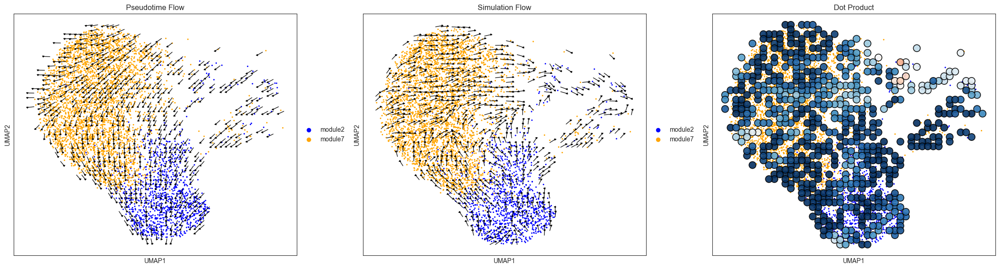

In [202]:
import scanpy as sc
import numpy as np
import matplotlib.pyplot as plt
from scipy.spatial import cKDTree
import matplotlib.patches as patches
import warnings
warnings.filterwarnings("ignore")

def compare_dev_pseudotime_simulation(
        dev,
        adata,
        threshold_percentile=50,
        arrow_head=0.04,
        body_scale=0.25,
        grid_fraction=0.5,
        max_grids=None,
        random_state=0):

    np.random.seed(random_state)

    cell_coordinates = dev.embedding
    grid_coordinates = dev.gridpoints_coordinates
    ref_flow_grid = dev.ref_flow
    flow_grid = dev.flow

    total_grids = grid_coordinates.shape[0]

    if grid_fraction < 1.0:
        n_keep = int(total_grids * grid_fraction)
        idx = np.random.choice(total_grids, n_keep, replace=False)
        grid_coordinates = grid_coordinates[idx]
        ref_flow_grid = ref_flow_grid[idx]
        flow_grid = flow_grid[idx]

    if max_grids is not None:
        if grid_coordinates.shape[0] > max_grids:
            idx = np.random.choice(grid_coordinates.shape[0],
                                   max_grids,
                                   replace=False)
            grid_coordinates = grid_coordinates[idx]
            ref_flow_grid = ref_flow_grid[idx]
            flow_grid = flow_grid[idx]

    tree = cKDTree(cell_coordinates)
    distances, _ = tree.query(grid_coordinates, k=1)
    threshold = np.percentile(distances, threshold_percentile)
    mask = distances < threshold

    filtered_grid_coords = grid_coordinates[mask]
    filtered_ref_flow = ref_flow_grid[mask]
    filtered_sim_flow = flow_grid[mask]

    ref_norm = np.linalg.norm(filtered_ref_flow, axis=1)
    sim_norm = np.linalg.norm(filtered_sim_flow, axis=1)

    ref_unit = np.zeros_like(filtered_ref_flow)
    sim_unit = np.zeros_like(filtered_sim_flow)

    mask_ref = ref_norm > 1e-6
    mask_sim = sim_norm > 1e-6

    ref_unit[mask_ref] = filtered_ref_flow[mask_ref] / ref_norm[mask_ref, None]
    sim_unit[mask_sim] = filtered_sim_flow[mask_sim] / sim_norm[mask_sim, None]

    dot = np.sum(ref_unit * sim_unit, axis=1)
    valid = mask_ref & mask_sim

    print("Total grids after subsampling:", filtered_grid_coords.shape[0])

    cluster_palette = {}
    for cl in adata.obs["module_cluster"].unique():
        if cl == "module2":
            cluster_palette[cl] = "blue"
        elif cl == "module7":
            cluster_palette[cl] = "orange"
        else:
            cluster_palette[cl] = "lightgray"

    fig, axes = plt.subplots(1, 3, figsize=(22, 6))

    ax1 = axes[0]
    sc.pl.umap(
        adata,
        color="module_cluster",
        palette=cluster_palette,
        ax=ax1,
        show=False,
        size=20
    )

    for i in range(len(filtered_grid_coords)):
        if mask_ref[i]:
            ux, uy = ref_unit[i]
            angle = np.arctan2(uy, ux)
            cx = filtered_grid_coords[i, 0] + ux * body_scale
            cy = filtered_grid_coords[i, 1] + uy * body_scale
            ax1.plot([filtered_grid_coords[i, 0], cx],
                     [filtered_grid_coords[i, 1], cy],
                     linewidth=1.0,
                     color="black",
                     alpha=0.9)
            tri = patches.RegularPolygon(
                (cx, cy),
                numVertices=3,
                radius=arrow_head,
                orientation=angle,
                facecolor="black",
                edgecolor="black",
                alpha=0.9
            )
            ax1.add_patch(tri)

    ax1.set_title("Pseudotime Flow")

    ax2 = axes[1]
    sc.pl.umap(
        adata,
        color="module_cluster",
        palette=cluster_palette,
        ax=ax2,
        show=False,
        size=20
    )

    for i in range(len(filtered_grid_coords)):
        if mask_sim[i]:
            ux, uy = sim_unit[i]
            angle = np.arctan2(uy, ux)
            cx = filtered_grid_coords[i, 0] + ux * body_scale
            cy = filtered_grid_coords[i, 1] + uy * body_scale
            ax2.plot([filtered_grid_coords[i, 0], cx],
                     [filtered_grid_coords[i, 1], cy],
                     linewidth=1.0,
                     color="black",
                     alpha=0.9)
            tri = patches.RegularPolygon(
                (cx, cy),
                numVertices=3,
                radius=arrow_head,
                orientation=angle,
                facecolor="black",
                edgecolor="black",
                alpha=0.9
            )
            ax2.add_patch(tri)

    ax2.set_title("Simulation Flow")

    ax3 = axes[2]
    sc.pl.umap(
        adata,
        color="module_cluster",
        palette=cluster_palette,
        ax=ax3,
        show=False,
        size=20,
        legend_loc="none"
    )

    ax3.scatter(
        filtered_grid_coords[valid, 0],
        filtered_grid_coords[valid, 1],
        s=120,
        c=dot[valid],
        cmap="RdBu_r",
        vmin=-1,
        vmax=1,
        edgecolors="black",
        linewidth=1.2,
        alpha=0.9
    )

    ax3.set_title("Dot Product")

    plt.tight_layout()
    plt.show()

    return {
        "filtered_grid_coords": filtered_grid_coords,
        "pseudotime_unit_vector": ref_unit,
        "simulation_unit_vector": sim_unit,
        "dot": dot,
        "valid": valid
    }


results = compare_dev_pseudotime_simulation(dev, total_adata_subset)